# Classifier comparison

In [1]:
%load_ext autoreload
%reload_ext autoreload
%autoreload 2
%matplotlib inline
#https://ipython.org/ipython-doc/3/config/extensions/autoreload.html
# Reload all modules (except those excluded by %aimport) every time before executing the Python code typed.


In [84]:
import logging 
import joblib
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from matplotlib.colors import ListedColormap

import seaborn as sns

import algo_ecg.data
import algo_ecg.preprocessing
#import algo_ecg.model
from algo_ecg.feature_transformer import \
    calculate_hrv_based_on_peak_intervals, \
    calculate_hrv_based_on_peak_intervals3, \
    FindPeaksCustomTransformer, select_cols, \
    AllFeatureCustomTransformer, \
    filter_interpolation_calculate_fre_domain_features, \
    generate_time_fre_domain_features, \
    functional_return_all_features

from sklearn.base import BaseEstimator, TransformerMixin
import sklearn.model_selection
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler


from sklearn.metrics import RocCurveDisplay, f1_score, accuracy_score, \
precision_score, recall_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import GridSearchCV

from sklearn.inspection import DecisionBoundaryDisplay

### Load data

In [3]:
X_in, y = algo_ecg.data.import_physionet_data('../data', num_files_to_read=1000)
#X_in, y = algo_ecg.data.import_physionet_data('../data')

In [4]:
X = algo_ecg.preprocessing.preprocess(X_in)

In [5]:
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, train_size=.7)

In [6]:
slice_length = len(X_train[0])
X_train = np.concatenate(X_train).reshape(-1, slice_length, 1)
X_test = np.concatenate(X_test).reshape(-1, slice_length, 1)

X_train_pd = pd.DataFrame.from_records(X_train)
X_test_pd = pd.DataFrame.from_records(X_test)



### Feature exploration

In [85]:
pipe = Pipeline(steps=[
    ('features_all',AllFeatureCustomTransformer(axis = 1))
]) 

In [86]:
X_train_pd_features = pipe.fit_transform(X_train_pd)
X_test_pd_features = pipe.fit_transform(X_test_pd)

In [16]:
X_train_pd_features['y'] = y_train
X_train_pd_features.iloc[:5, ]

,Mean_RR_ms,STD_RR_ms,Mean_HR_beats_per_min_kubio,Mean_HR_beats_per_min,STD_HR_beats_per_min,Min_HR_beats_per_min,Max_HR_beats_per_min,RMSSD_ms,NN50,pNN50,...,Power_LF_ms2,Power_HF_ms2,Power_Total_ms2,LF_HF_ratio,Peak_VLF_Hz,Peak_LF_Hz,Peak_HF_Hz,Fraction_LF_nu,Fraction_HF_nu,y
0,675.454545,181.618830,88.829071,94.244925,20.515043,52.785924,119.205298,255.363145,28,63.636364,...,114.776201,441.179104,986.735315,0.260158,0.034483,0.068966,0.310345,20.644861,79.355139,1
1,893.535354,30.150458,67.148994,67.225782,2.276724,63.604240,71.428571,9.185587,0,0.000000,...,1.147858,1.500917,12.343014,0.764772,0.033898,0.067797,0.338983,43.335442,56.664558,0
2,653.407407,29.224452,91.826324,92.007847,4.061163,84.507042,97.826087,7.212503,0,0.000000,...,2.133160,1.090918,15.188685,1.955380,0.033898,0.101695,0.203390,66.163399,33.836601,0
3,583.202614,97.119653,102.880197,104.834122,12.045877,57.507987,120.000000,95.626589,20,39.215686,...,4.064198,15.284314,26.026366,0.265906,0.000000,0.104348,0.382609,21.005224,78.994776,0
4,840.476190,95.595520,71.388102,72.665893,11.432312,62.937063,116.129032,97.759208,18,51.428571,...,36.237073,43.423183,85.182896,0.834510,0.033058,0.066116,0.396694,45.489527,54.510473,0


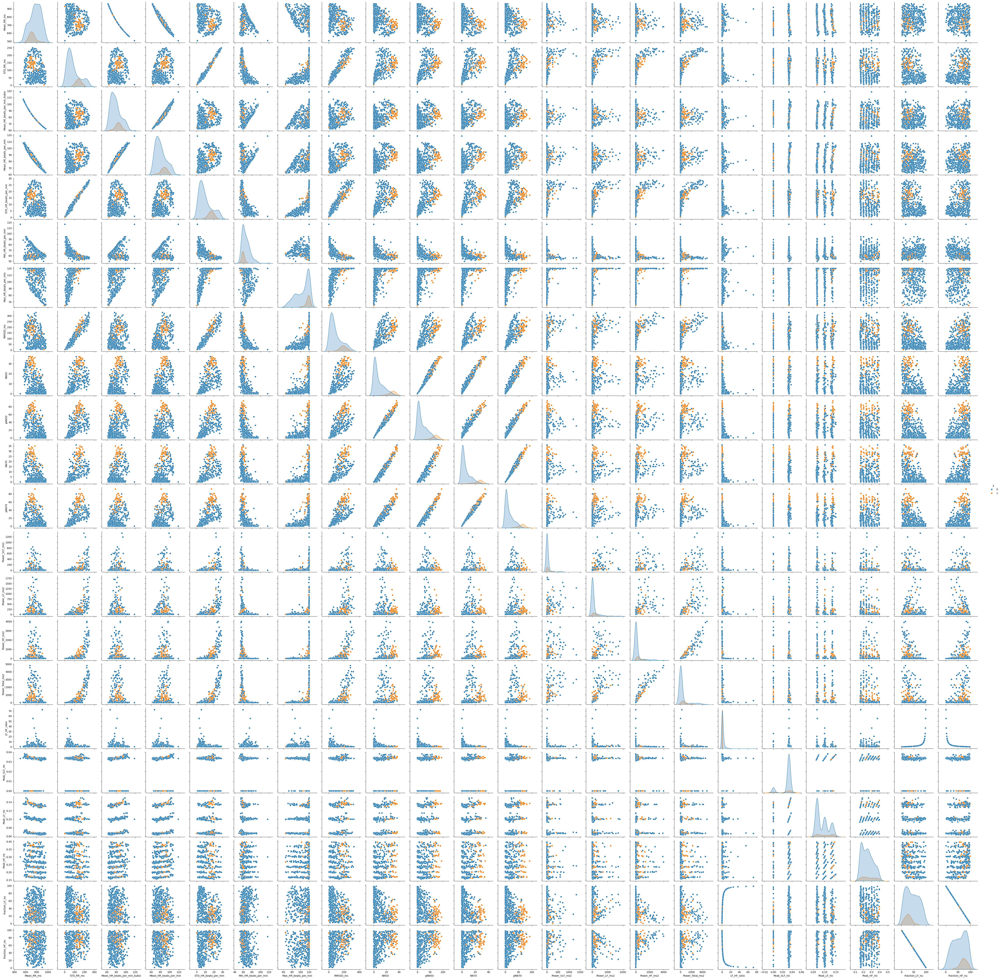

In [17]:
sns.pairplot(X_train_pd_features, hue = "y")

There is definitely the multicolinearity we observe in the feature set that might cause problems, in particular if we fit a linear model on the raw feature set. We do a feature selection step and let's see if this problem is reduced. 

In [88]:
pipe = Pipeline(steps=[
    ('features_all', 
         AllFeatureCustomTransformer(axis = 1)), 
    ('feature_selection', 
         SelectFromModel(LinearSVC(dual="auto", penalty="l1", C = 0.01))), 
]) 

In [89]:
pipe.fit(X_train_pd, y_train)

/Users/jessie/.pyenv/versions/cinc/lib/python3.8/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Pipeline(steps=[('features_all', AllFeatureCustomTransformer()),
                ('feature_selection',
                 SelectFromModel(estimator=LinearSVC(C=0.01, dual='auto',
                                                     penalty='l1')))])

In [90]:
pipe.named_steps.feature_selection.get_feature_names_out()

array(['Mean_RR_ms', 'STD_RR_ms', 'Mean_HR_beats_per_min_kubio',
       'Mean_HR_beats_per_min', 'Max_HR_beats_per_min', 'RMSSD_ms',
       'pNN70', 'Power_VLF_ms2', 'Power_HF_ms2', 'Power_Total_ms2',
       'Fraction_HF_nu'], dtype=object)

In [91]:
pipe2 = Pipeline(steps=[
    ('features_all', 
         AllFeatureCustomTransformer(axis = 1)), 
    ('feature_select_manual',
     FunctionTransformer(select_cols, kw_args={"col_names": pipe.named_steps.feature_selection.get_feature_names_out()})), 
]) 

In [92]:
X_train_pd_features2 = pipe2.fit_transform(X_train_pd)
X_test_pd_features2 = pipe2.fit_transform(X_test_pd)

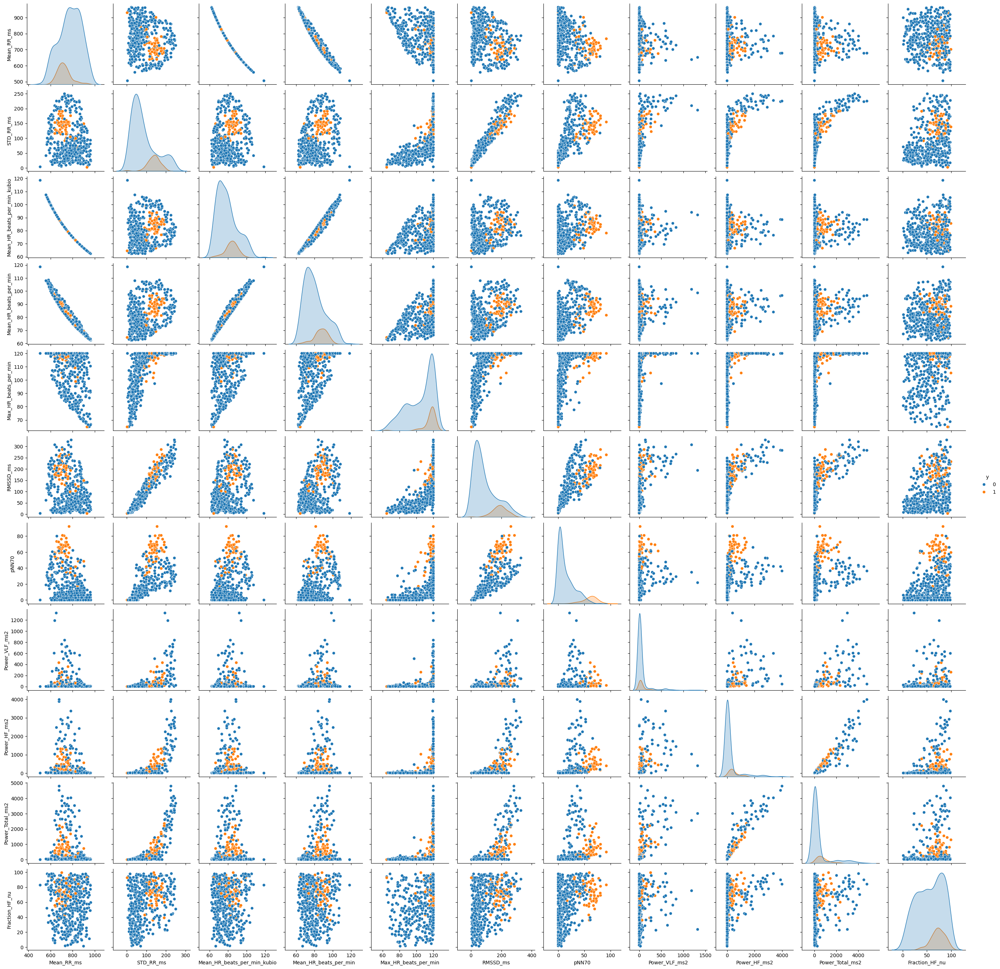

In [26]:
X_train_pd_features2['y'] = y_train
sns.pairplot(X_train_pd_features2, hue = "y")

Ok, this did not get rid of colinearity completely but remember "Contrary to popular belief, including collinear variables does not reduce the predictive power or reliability of the model as a whole. In fact, high collinearity indicates that it is exceptionally important to include all variables, as excluding any variable will cause strong confounding. However, while including collinear variables in a regression does not bias coefficients outright, multicollinearity inflates biases from other sources, often resulting in polarized coefficients and excess type 1 errors (i.e. false positives)". This can be seen from our validation result from the initial pipeline. So one way to reduced colinearity is to do dimension reduction, i.e. PCA. However I want to take a look at classifiers that might not be too sensitive to issues introduced by colinearity and data that is perhaps not linearly separable. So let's do a classifier comparison. https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html

In [68]:
names = [
    "Logistic Regression", 
    "Linear SVM",
    "RBF SVM",
    "Decision Tree",
    "Random Forest",
]
classifiers = [
    LogisticRegression(max_iter=1000, tol=0.1, class_weight = "balanced"),
    SVC(kernel="linear", C=0.025, random_state=42),
    SVC(gamma=2, C=1, random_state=42),
    DecisionTreeClassifier(max_depth=5, random_state=42),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1, random_state=42)
]



In [69]:
X_train_pd_features2.iloc[: 5, ]

,Mean_RR_ms,STD_RR_ms,Mean_HR_beats_per_min_kubio,Mean_HR_beats_per_min,Max_HR_beats_per_min,RMSSD_ms,pNN70,Power_VLF_ms2,Power_HF_ms2,Power_Total_ms2,Fraction_HF_nu
0,675.454545,181.618830,88.829071,94.244925,119.205298,255.363145,61.363636,430.780011,441.179104,986.735315,79.355139
1,893.535354,30.150458,67.148994,67.225782,71.428571,9.185587,0.000000,9.694239,1.500917,12.343014,56.664558
2,653.407407,29.224452,91.826324,92.007847,97.826087,7.212503,0.000000,11.964607,1.090918,15.188685,33.836601
3,583.202614,97.119653,102.880197,104.834122,120.000000,95.626589,27.450980,6.677853,15.284314,26.026366,78.994776
4,840.476190,95.595520,71.388102,72.665893,116.129032,97.759208,28.571429,5.522640,43.423183,85.182896,54.510473


In [70]:
x_min, x_max = X_train_pd_features2.pNN70.min() - 0.5, X_train_pd_features2.pNN70.max() + 0.5
y_min, y_max = X_train_pd_features2.RMSSD_ms.min() - 0.5, X_train_pd_features2.RMSSD_ms.max() + 0.5

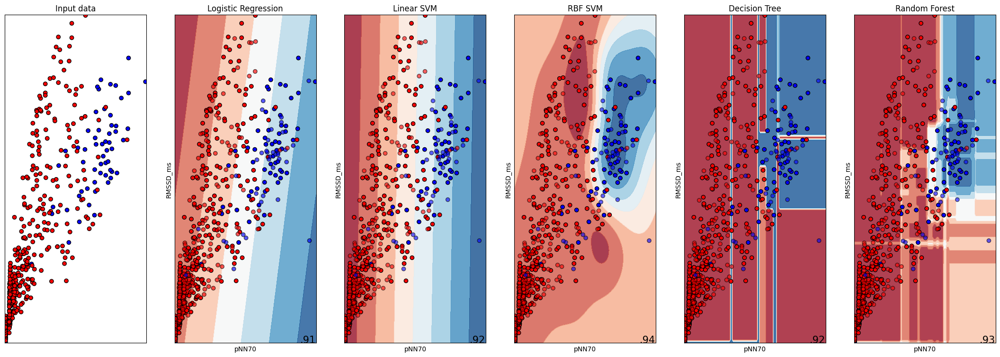

In [71]:
i = 1
figure = plt.figure(figsize=(27, 9))
# just plot the dataset first
cm = plt.cm.RdBu
cm_bright = ListedColormap(["#FF0000", "#0000FF"])

ax = plt.subplot(1, len(classifiers) + 1, i)
ax.set_title("Input data")
# Plot the training points
ax.scatter(X_train_pd_features2.pNN70, X_train_pd_features2.RMSSD_ms, c=y_train, cmap=cm_bright, edgecolors="k")
# Plot the testing points
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xticks(())
ax.set_yticks(())

ax = plt.subplot(1, len(classifiers) + 1, i+1)
ax.scatter(
    X_test_pd_features2.pNN70, X_test_pd_features2.RMSSD_ms, c=y_test, cmap=cm_bright, alpha=0.6, edgecolors="k"
)
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xticks(())
ax.set_yticks(())


i =2 
# iterate over classifiers
for name, clf in zip(names, classifiers):
    ax = plt.subplot(1, len(classifiers) + 1, i)

    clf = make_pipeline(StandardScaler(), clf)
    clf.fit(X_train_pd_features2[['pNN70', 'RMSSD_ms']], y_train)
    score = clf.score(X_test_pd_features2[['pNN70', 'RMSSD_ms']], y_test)
    DecisionBoundaryDisplay.from_estimator(
        clf, X_train_pd_features2[['pNN70', 'RMSSD_ms']], cmap=cm, alpha=0.8, ax=ax, eps=0.5
    )

    # Plot the training points
    ax.scatter(
        X_train_pd_features2.pNN70, X_train_pd_features2.RMSSD_ms, c=y_train, cmap=cm_bright, edgecolors="k"
    )
    # Plot the testing points
    ax.scatter(
        X_test_pd_features2.pNN70,
        X_test_pd_features2.RMSSD_ms,
        c=y_test,
        cmap=cm_bright,
        edgecolors="k",
        alpha=0.6,
    )

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(name)
    ax.text(
        x_max - 0.3,
        y_min + 0.3,
        ("%.2f" % score).lstrip("0"),
        size=15,
        horizontalalignment="right",
    )
    i += 1

In [116]:
#https://scikit-learn.org/stable/modules/model_evaluation.html
results = pd.DataFrame({
    'name': [], 
    'tn': [], 
    'fp': [], 
    'fn': [], 
    'tp': [], 
    'accuracy_train': [], 
    'F1_train': [],     
    'precision_train': [],     
    'recall_train': [],     
    'accuracy_test': [], 
    'F1_test': [],     
    'precision_test': [],     
    'recall_test': [],     
})
for name, clf in zip(names, classifiers):   
    clf = make_pipeline(StandardScaler(), clf)
    clf.fit(X_train_pd_features2, y_train)
    y_test_pred = clf.predict(X_test_pd_features2)
    y_train_pred = clf.predict(X_train_pd_features2)
    tn, fp, fn, tp = confusion_matrix(y_test, y_test_pred).ravel()
    accu = accuracy_score(y_test, y_test_pred)
    f1 = f1_score(y_test, y_test_pred)
    prec = precision_score(y_test, y_test_pred)  
    reca = recall_score(y_test, y_test_pred) 
    accu_train = accuracy_score(y_train, y_train_pred)
    f1_train = f1_score(y_train, y_train_pred)
    prec_train = precision_score(y_train, y_train_pred)  
    reca_train = recall_score(y_train, y_train_pred) 
    result = [name, tn, fp, fn, tp, \
              accu_train, f1_train, prec_train, reca_train, \
              accu, f1, prec, reca
             ]
    res = {results.keys()[i]: result[i] for i in range(len(results.keys()))}
    results = pd.concat([results, pd.DataFrame([res])], ignore_index = True)

In [117]:
results

,name,tn,fp,fn,tp,accuracy_train,F1_train,precision_train,recall_train,accuracy_test,F1_test,precision_test,recall_test
0,Logistic Regression,157.0,15.0,5.0,31.0,0.917012,0.729730,0.606742,0.915254,0.903846,0.756098,0.673913,0.861111
1,Linear SVM,170.0,2.0,16.0,20.0,0.946058,0.745098,0.883721,0.644068,0.913462,0.689655,0.909091,0.555556
2,RBF SVM,172.0,0.0,22.0,14.0,0.987552,0.946429,1.000000,0.898305,0.894231,0.560000,1.000000,0.388889
3,Decision Tree,171.0,1.0,12.0,24.0,0.973029,0.878505,0.979167,0.796610,0.937500,0.786885,0.960000,0.666667
4,Random Forest,170.0,2.0,12.0,24.0,0.968880,0.871795,0.879310,0.864407,0.932692,0.774194,0.923077,0.666667
